# PaddleHub抠图比赛：+opencv提取视频人物图片

本示例用DeepLabv3+模型完成一键抠图。
使用python-opencv读取视频，并提取带有头像的图片
使用paddlehub的模型抠图
目前效果不是特别好

In [23]:
!pip install paddlehub==1.6.0 -i https://pypi.tuna.tsinghua.edu.cn/simple

Looking in indexes: https://pypi.tuna.tsinghua.edu.cn/simple


In [24]:
import cv2, numpy as np
import matplotlib.pyplot as plt 
import matplotlib.image as mping


In [43]:

def read(fin, outdir):
    # 每12帧取1帧
    frameSum = 0
    frameFre = 12
    ret = True
    # 人脸识别
    cascade = cv2.CascadeClassifier("./haarcascade_frontalface_default.xml")
    while ret:
        frameSum = frameSum+1
        if((frameSum%frameFre)==0):
            faces = cascade.detectMultiScale(frame,scaleFactor=1.1,minNeighbors=5,minSize=(50, 50))
            if len(faces)>0:
                cv2.imwrite(outdir+'/'+str(frameSum)+'.jpg',frame)
                print(outdir+'/'+str(frameSum)+'.jpg')
        ret, frame = fin.read()
        if frameSum>100*frameFre:
            break
# def abstract(fin, outdir):
#     frameSum = 0
#     frameFre = 24
#     ret = True
#     while ret:
#         frameSum = frameSum+1
#         if((frameSum%frameFre)==0):    
#             ret, frame = fin.read()
#         if frameSum>10*frameFre:
#             break

In [44]:

video_paths = ['video/杨超越.mp4']
for video_path in video_paths:
    fin = cv2.VideoCapture(video_path)
    read(fin, video_path.replace('.mp4',''))
    #abstract(fin, video_path.replace('.mp4','')+'/role')


video/杨超越/12.jpg
video/杨超越/24.jpg
video/杨超越/36.jpg
video/杨超越/48.jpg
video/杨超越/60.jpg
video/杨超越/72.jpg
video/杨超越/84.jpg
video/杨超越/96.jpg
video/杨超越/108.jpg
video/杨超越/120.jpg
video/杨超越/132.jpg
video/杨超越/144.jpg
video/杨超越/156.jpg
video/杨超越/168.jpg
video/杨超越/180.jpg
video/杨超越/192.jpg
video/杨超越/204.jpg
video/杨超越/216.jpg
video/杨超越/228.jpg
video/杨超越/240.jpg
video/杨超越/252.jpg
video/杨超越/264.jpg
video/杨超越/276.jpg
video/杨超越/288.jpg


In [ ]:

from os import listdir

In [ ]:
import paddlehub as hub
!hub install deeplabv3p_xception65_humanseg

/opt/conda/envs/python35-paddle120-env/lib/python3.7/site-packages/sklearn/externals/joblib/externals/cloudpickle/cloudpickle.py:47: DeprecationWarning: the imp module is deprecated in favour of importlib; see the module's documentation for alternative uses
  import imp
Module deeplabv3p_xception65_humanseg already installed in /home/aistudio/.paddlehub/modules/deeplabv3p_xception65_humanseg


In [45]:

module = hub.Module(name="deeplabv3p_xception65_humanseg")
prefixPath = video_path.replace('.mp4','')
img_paths = listdir(prefixPath)
img_paths = [prefixPath+'/'+i for i in img_paths]
input_dict = {"image": img_paths}

# execute predict and print the result
results = module.segmentation(data=input_dict)
for result in results:
    print(result)

[2020-04-05 16:04:14,351] [    INFO] - Installing deeplabv3p_xception65_humanseg module
[2020-04-05 16:04:14,423] [    INFO] - Module deeplabv3p_xception65_humanseg already installed in /home/aistudio/.paddlehub/modules/deeplabv3p_xception65_humanseg
[2020-04-05 16:04:15,130] [    INFO] - 0 pretrained paramaters loaded by PaddleHub


{'origin': 'video/杨超越/228.jpg', 'processed': 'humanseg_output/228.png'}
{'origin': 'video/杨超越/180.jpg', 'processed': 'humanseg_output/180.png'}
{'origin': 'video/杨超越/168.jpg', 'processed': 'humanseg_output/168.png'}
{'origin': 'video/杨超越/36.jpg', 'processed': 'humanseg_output/36.png'}
{'origin': 'video/杨超越/24.jpg', 'processed': 'humanseg_output/24.png'}
{'origin': 'video/杨超越/84.jpg', 'processed': 'humanseg_output/84.png'}
{'origin': 'video/杨超越/156.jpg', 'processed': 'humanseg_output/156.png'}
{'origin': 'video/杨超越/12.jpg', 'processed': 'humanseg_output/12.png'}
{'origin': 'video/杨超越/60.jpg', 'processed': 'humanseg_output/60.png'}
{'origin': 'video/杨超越/276.jpg', 'processed': 'humanseg_output/276.png'}
{'origin': 'video/杨超越/72.jpg', 'processed': 'humanseg_output/72.png'}
{'origin': 'video/杨超越/252.jpg', 'processed': 'humanseg_output/252.png'}
{'origin': 'video/杨超越/192.jpg', 'processed': 'humanseg_output/192.png'}
{'origin': 'video/杨超越/264.jpg', 'processed': 'humanseg_output/264.png'}
{'or

In [33]:
import matplotlib.image as mpimg
plt.figure(figsize=(10,10))
img = mpimg.imread("work/AnotherDay/1992.jpg")
plt.imshow(img) 
plt.axis('off') 
plt.show()

图片合成

In [37]:
from PIL import Image
import numpy as np

def blend_images(fore_image, base_image):
    """
    将抠出的人物图像换背景
    fore_image: 前景图片，抠出的人物图片
    base_image: 背景图片
    """
    # 读入图片
    base_image = Image.open(base_image).convert('RGB')
    fore_image = Image.open(fore_image).resize(base_image.size)

    # 图片加权合成
    scope_map = np.array(fore_image)[:,:,-1] / 255
    scope_map = scope_map[:,:,np.newaxis]
    scope_map = np.repeat(scope_map, repeats=3, axis=2)
    res_image = np.multiply(scope_map, np.array(fore_image)[:,:,:3]) + np.multiply((1-scope_map), np.array(base_image))
    
    #保存图片
    res_image = Image.fromarray(np.uint8(res_image))
    res_image.save("blend_res_img.jpg")

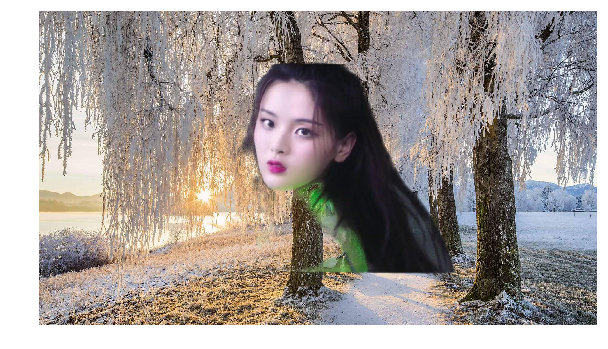

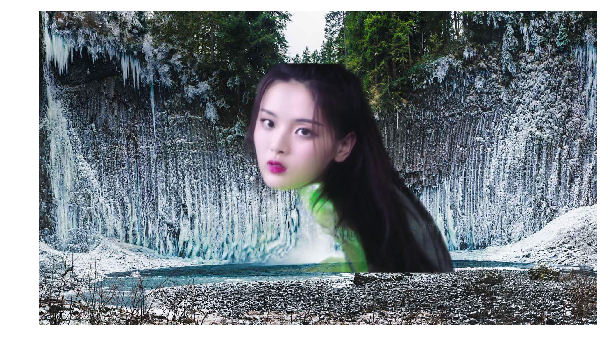

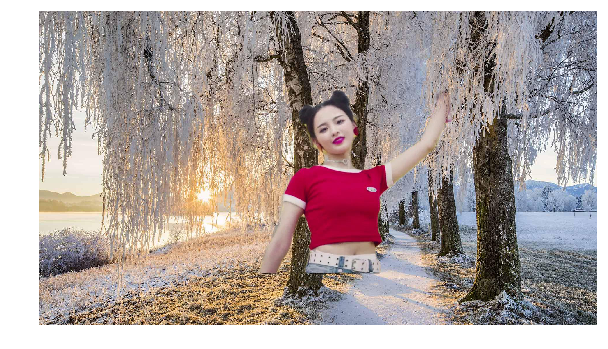

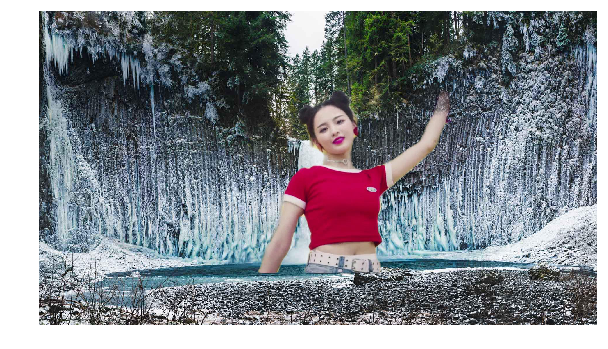

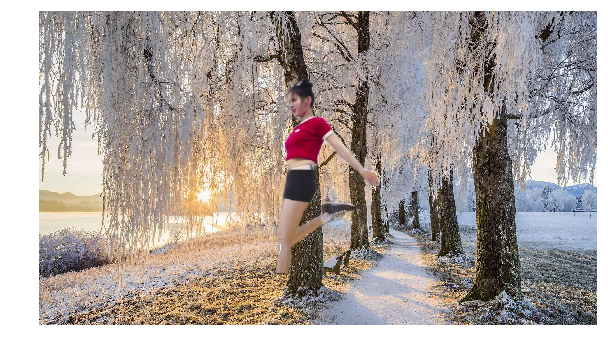

...

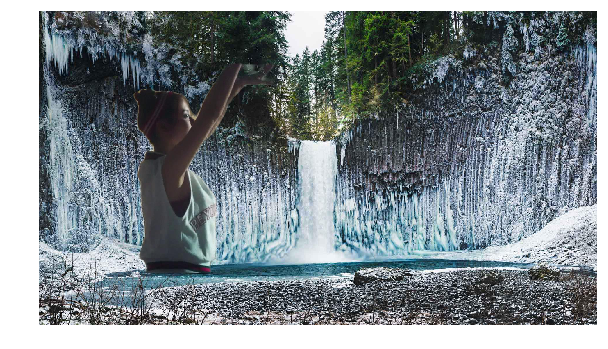

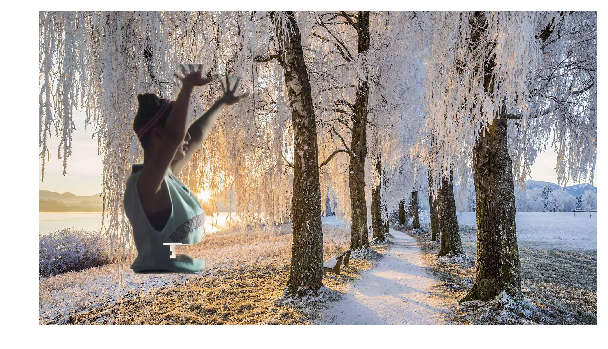

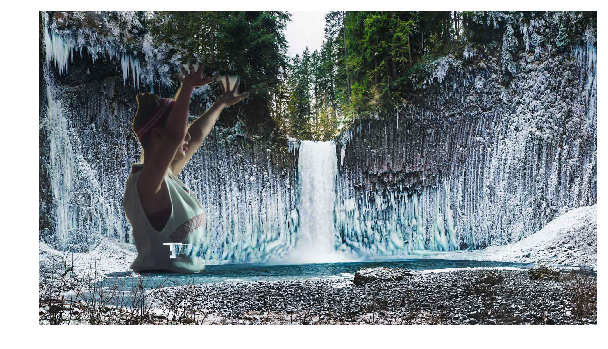

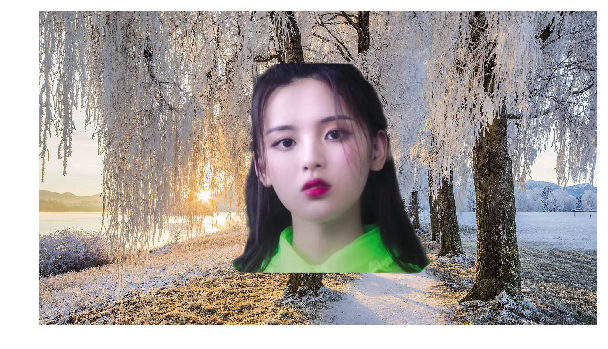

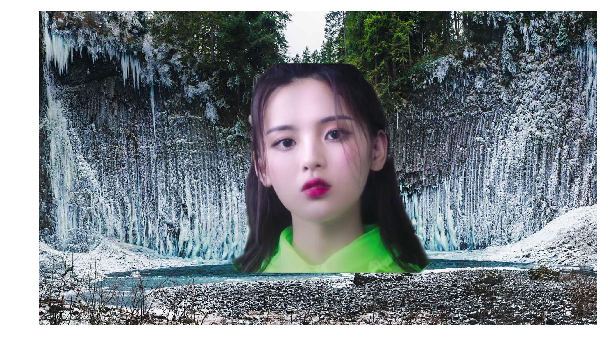

IsADirectoryError: [Errno 21] Is a directory: 'humanseg_output/.ipynb_checkpoints'

In [53]:
fore_path = "humanseg_output"
fore_paths = listdir(fore_path)
fore_paths = [fore_path+'/'+i for i in fore_paths]

base_path = "pictures"
base_paths = listdir(base_path)
base_paths = [base_path+'/'+i for i in base_paths]

for file in fore_paths:
    fore_dict = file;
    for file in base_paths:
        base_dict = file;
        blend_images(fore_dict, base_dict)

        # 展示合成图片
        plt.figure(figsize=(10,10))
        img = mpimg.imread("./blend_res_img.jpg")
        plt.imshow(img) 
        plt.axis('off') 
        plt.show()